In [1]:
import scanpy as sc
import infercnvpy as cnv
import matplotlib.pyplot as plt
import warnings

warnings.simplefilter("ignore")
import omicverse as ov
ov.plot_set()


   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.11, Tutorials: https://omicverse.readthedocs.io/
Dependency error: The 'phate>=1.0' distribution was not found and is required by the application


In [99]:
sc.logging.print_header()

scanpy==1.10.4 anndata==0.11.3 umap==0.5.7 numpy==1.26.4 scipy==1.11.4 pandas==2.2.3 scikit-learn==1.6.1 statsmodels==0.14.4 igraph==0.11.8 pynndescent==0.5.13


In [3]:
adata = ov.read('/home/lugli/spuccio/Projects/SP039/GBmap/Abdelfattah2022_Part3.h5ad')

In [4]:
adata.obs['scsa_celltype_panglaodb'].value_counts()

scsa_celltype_panglaodb
Macrophages                    41103
Neural Stem/Precursor Cells    18041
Müller Cells                   11342
Fibroblasts                     8100
T Cells                         6888
Neurons                         6840
Pluripotent Stem Cells          6112
Kupffer Cells                   5021
Monocytes                       3826
Oligodendrocytes                1198
Endothelial Cells               1080
NK Cells                         812
B Cells                          677
Mast Cells                       249
Name: count, dtype: int64

In [100]:
optim_palette=ov.pl.optim_palette(adata,basis='X_umap',colors='scsa_celltype_panglaodb')

|-----> Calculating cluster distance graph...
|-----------> Calculating cell neighborhood...
|-----------> Filtering out neighborhood outliers...
|-----------> Calculating cluster interlacement score...
|-----------> Constructing cluster interlacement graph...
|-----> Calculating color distance graph...
|-----------> Calculating color perceptual distance...
|-----------> Constructing color distance graph...
|-----------> Difference of the most similar pair in the palette is 50.76
|-----> Optimizing color mapping...


In [5]:
adata.var['start_position'] = adata.var['start_position'].astype(int)
adata.var['end_position'] = adata.var['end_position'].astype(int)

In [6]:
adata.var.columns

Index(['mt', 'n_cells', 'percent_cells', 'robust', 'means', 'variances',
       'residual_variances', 'ensembl_gene_id', 'start_position',
       'end_position', 'chromosome_name'],
      dtype='object')

In [7]:
adata.var.columns = ['mt', 'n_cells', 'percent_cells', 'robust', 'means', 'variances',
       'residual_variances', 'ensembl_gene_id', 'start',
       'end', 'chromosome']

In [8]:
adata.var['chromosome'] = "chr"+adata.var['chromosome'].astype(str)

In [10]:
cnv.tl.infercnv(
    adata,
    reference_key="scsa_celltype_panglaodb",
    reference_cat=[
    "Macrophages",
    "T Cells",
    "Kupffer Cells",
    "Monocytes",
    "NK Cells",
    "B Cells",
    "Mast Cells"],
    window_size=250,
)

  0%|          | 0/23 [00:00<?, ?it/s]

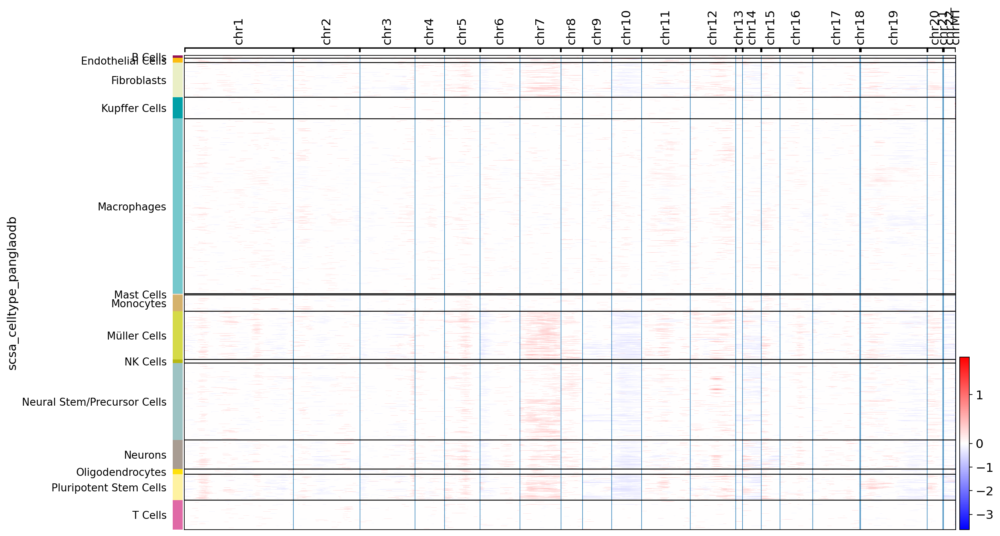

In [11]:
cnv.pl.chromosome_heatmap(adata, groupby="scsa_celltype_panglaodb")

In [29]:
ov.pp.neighbors(adata, n_neighbors=15, n_pcs=50,
               use_rep='X_harmony')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:12)


In [42]:
ov.pp.leiden(adata,resolution=0.4)

running Leiden clustering
    finished: found 18 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:04)


In [113]:
optim_palette2=ov.pl.optim_palette(adata,basis='X_umap',colors='leiden')

|-----> Calculating cluster distance graph...
|-----------> Calculating cell neighborhood...
|-----------> Filtering out neighborhood outliers...
|-----------> Calculating cluster interlacement score...
|-----------> Constructing cluster interlacement graph...
|-----> Calculating color distance graph...
|-----------> Calculating color perceptual distance...
|-----------> Constructing color distance graph...
|-----------> Difference of the most similar pair in the palette is 0.00
|-----> Optimizing color mapping...


In [47]:
sc.tl.dendrogram(adata, groupby='leiden')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


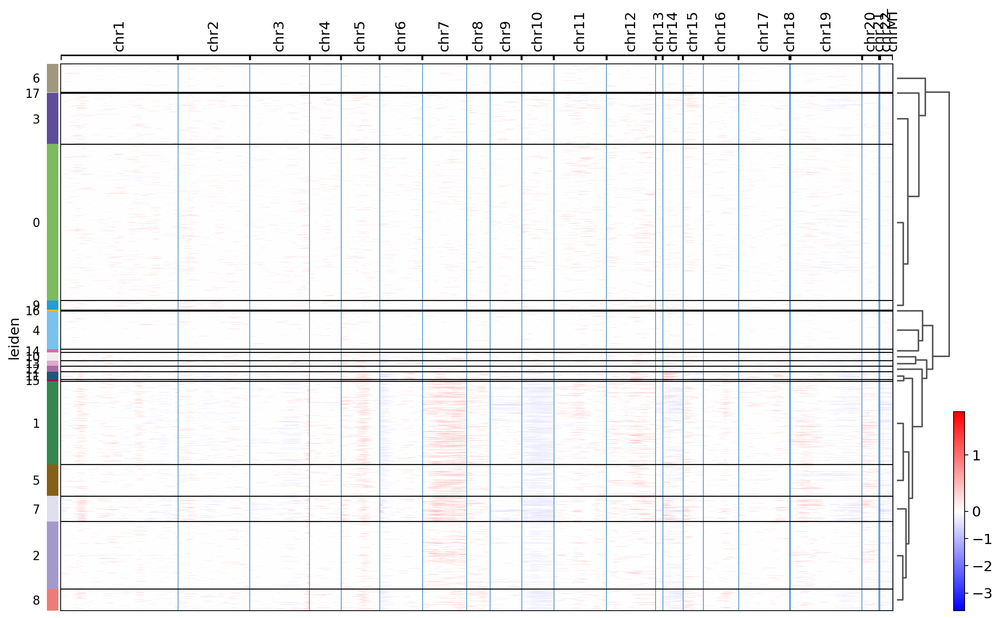

In [48]:
cnv.pl.chromosome_heatmap(adata, groupby="leiden", dendrogram=True)

In [32]:
cnv.tl.cnv_score(adata)

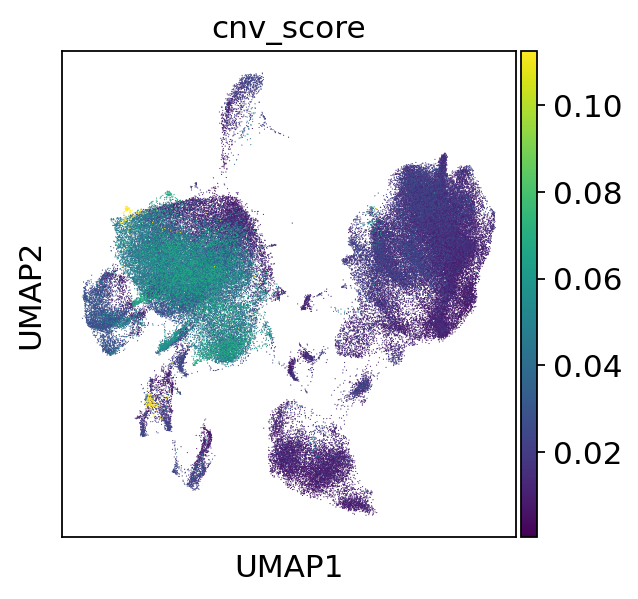

In [40]:
sc.pl.umap(adata, color="cnv_score")

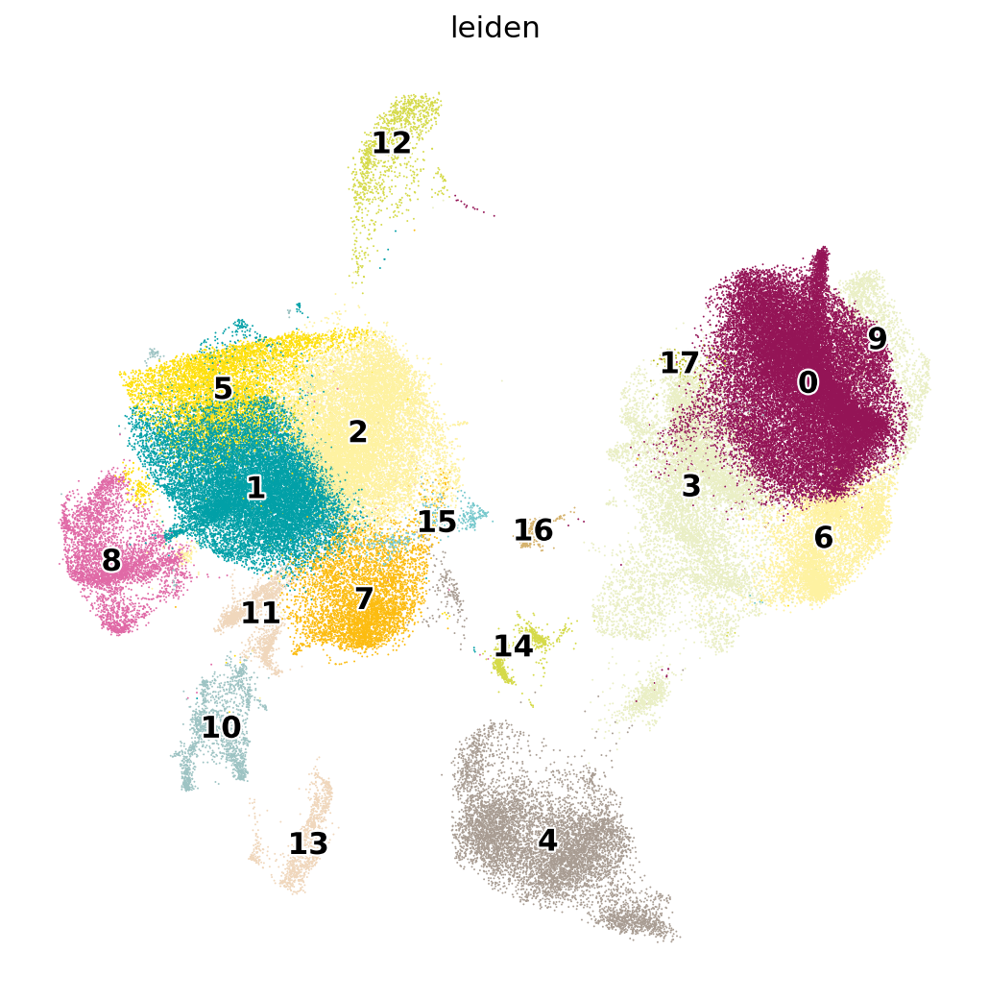

In [115]:
sc.pl.umap(
    adata,
    color="leiden",
    legend_loc="on data",s=3,
    legend_fontoutline=2,palette=optim_palette2
)

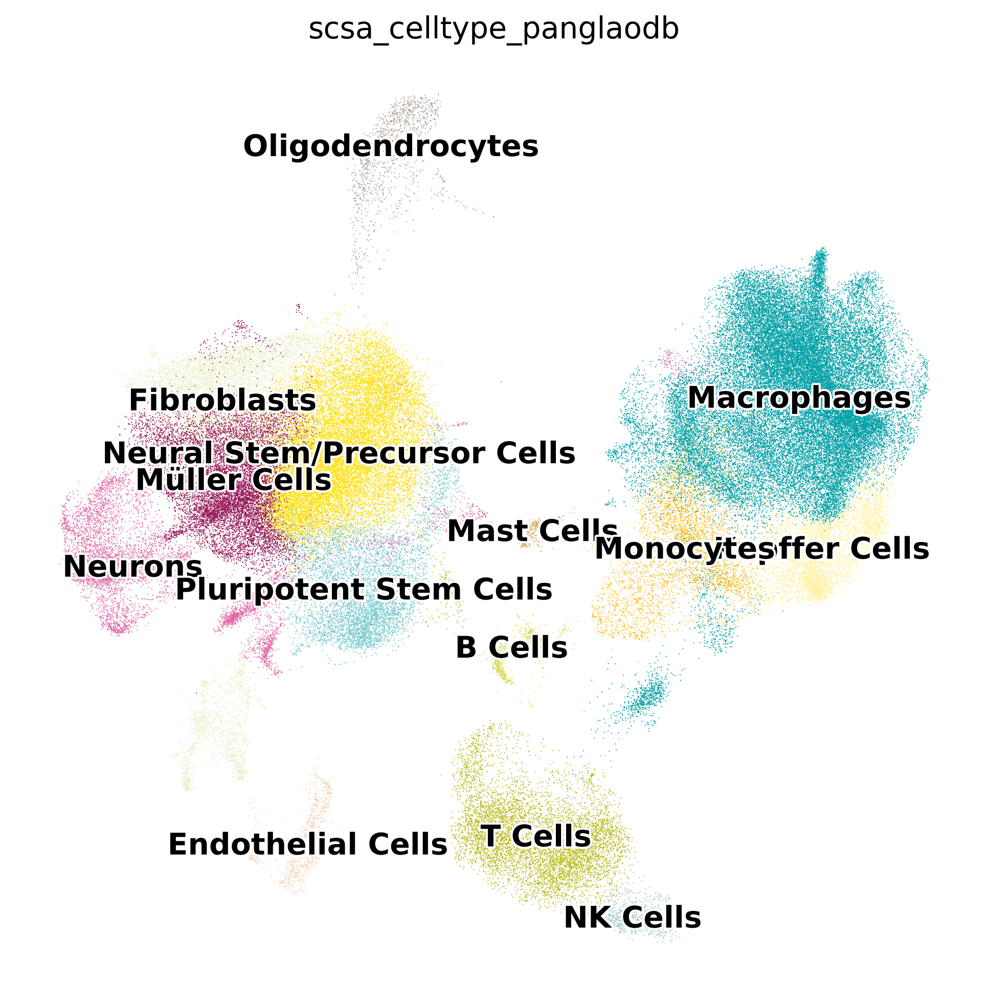

In [116]:
with plt.rc_context({"figure.figsize": (8, 8), "figure.dpi": (150)}):
    sc.pl.umap(
    adata,
    color="scsa_celltype_panglaodb",
    legend_loc="on data",palette=optim_palette,
    legend_fontoutline=2)



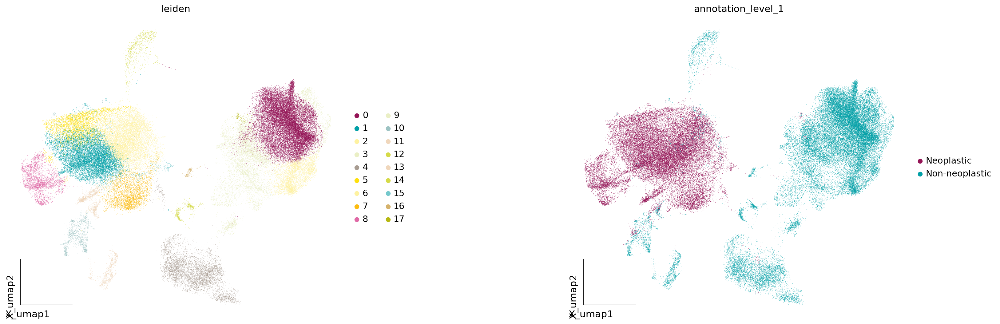

In [117]:
ov.pl.embedding(adata,
                basis='X_umap',
                color=['leiden','annotation_level_1'],palette=optim_palette2,
                frameon='small',wspace=0.5)

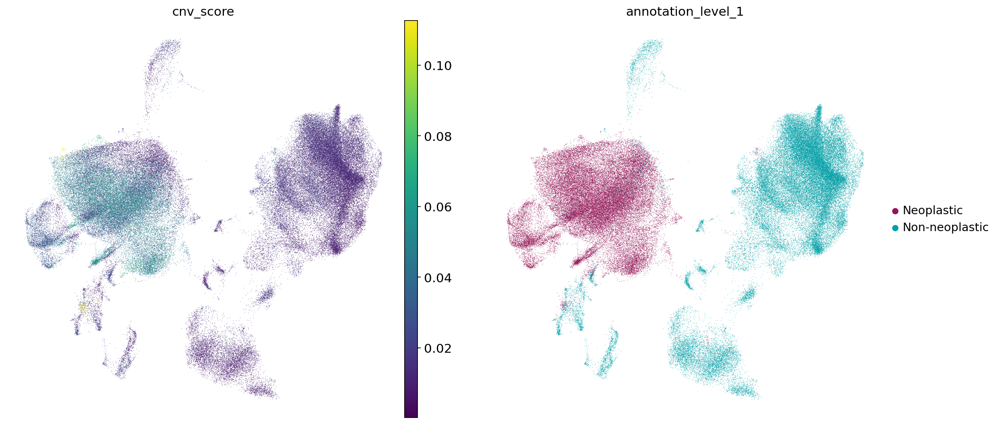

In [118]:
sc.pl.umap(adata, color=["cnv_score","annotation_level_1"])

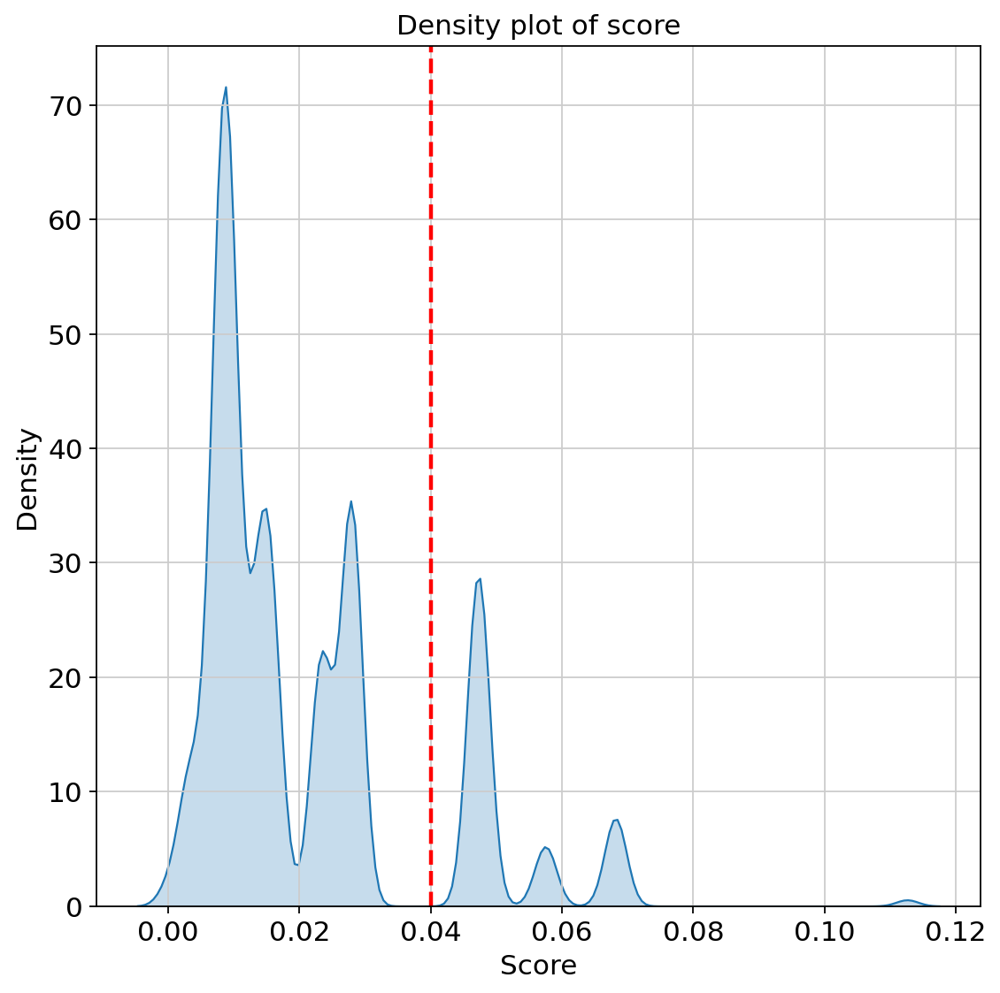

In [119]:
import seaborn as sns
sns.kdeplot(adata.obs["cnv_score"], fill=True)
plt.xlabel("Score")
plt.axvline(x=0.04, color='red', linestyle='--', linewidth=2)
plt.title("Density plot of score")
plt.show()

In [120]:
immune_cells = [
    "Macrophages",
    "T Cells",
    "Kupffer Cells",
    "Monocytes",
    "NK Cells",
    "B Cells",
    "Mast Cells"
]

# Filter out cells that are in immune_cells and have cnv_score > 0.04
filtered_adata = adata[~(
    (adata.obs["scsa_celltype_panglaodb"].isin(immune_cells)) &
    (adata.obs["cnv_score"] > 0.04)
)]

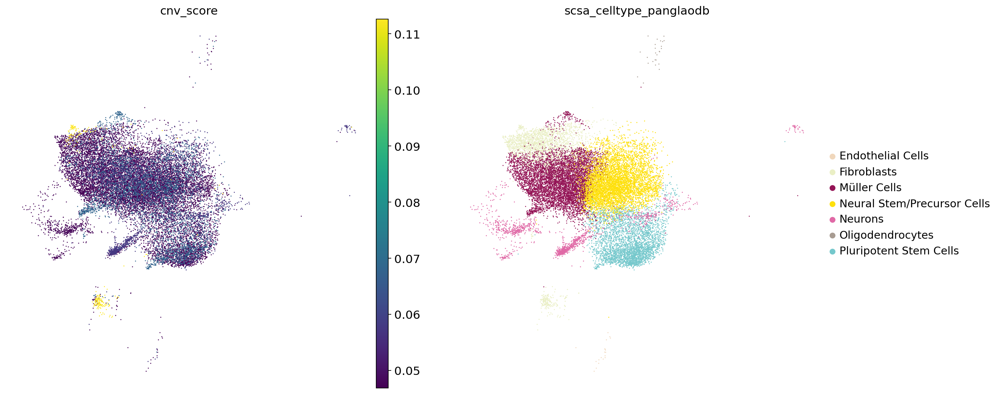

In [125]:
sc.pl.umap(filtered_adata[filtered_adata.obs["cnv_score"] > 0.04,:], color=["cnv_score","scsa_celltype_panglaodb"])

In [127]:
filtered_adata.obs["cnv_status"] = "normal"
filtered_adata.obs.loc[filtered_adata.obs["cnv_score"]> 0.04, "cnv_status"] = (
    "tumor"
)

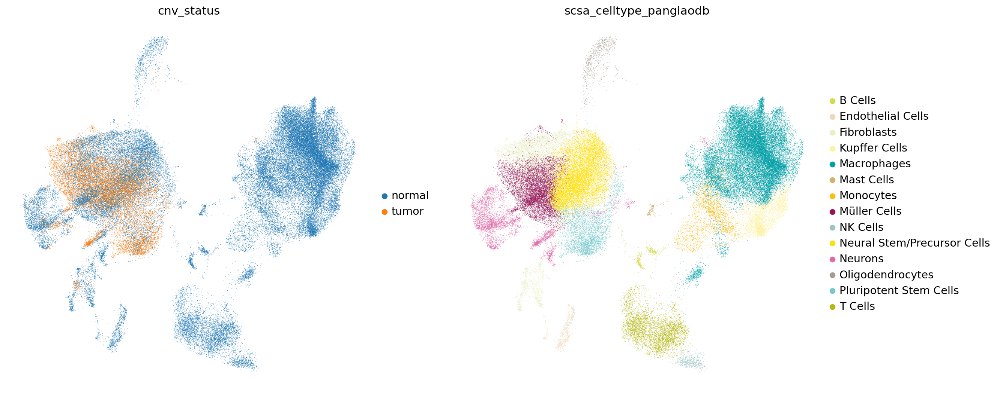

In [130]:
sc.pl.umap(filtered_adata, color=["cnv_status","scsa_celltype_panglaodb"])

In [131]:
filtered_adata.obs["annotation_level_1"] = filtered_adata.obs["cnv_status"]

In [133]:
filtered_adata.write("/home/lugli/spuccio/Projects/SP039/GBmap/Abdelfattah2022_Part4.h5ad")